We implement VGG net from the original [paper](https://arxiv.org/abs/1409.1556)

### Dataset
The goal is to train VGG on a subset of ImageNet ([ImageNet-100](https://www.kaggle.com/datasets/ambityga/imagenet100)). Images have high resolution and for our training, we used 224x224 images.

VGG model is a deep one using primarily very small 3x3 kernel convolutions and manages to achieve state of tha art at its time. Deeper nets with small filters had outperformed shallow ones with laeger filters.

The paper proposed 5 convolutional networks configurations. We choosed to implement architecture without local response normalizarion and 1x1 convolutions: VGG11 (11 weight layers), VGG13 (13 weight layers) VGG16 (16 weight layers) and VGG19 (19 weight layers) which uses only 3x3 convolutional layers.

<p align="center">
  <img src="vgg-model.png" alt="VGG" width="70%">
</p>

In [1]:
import numpy as np
import torchvision

import dataset

In [2]:
batch_size = 32

transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=256),
    torchvision.transforms.CenterCrop(size=256),
    torchvision.transforms.ToTensor()
])
data = dataset.ImageNet100(batch_size=batch_size, transforms=transforms)
num_classes = data.num_classes

In [3]:
len(data.train), len(data.eval)

(130000, 5000)

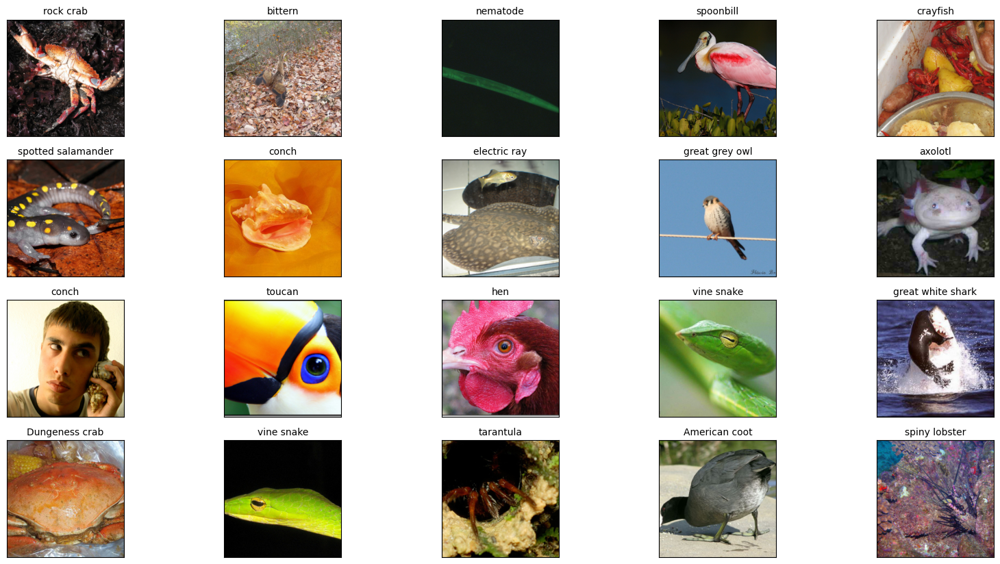

torch.Size([32, 3, 256, 256])


In [4]:
for batch in data.train_dataloader:
    x, y = batch
    labels = [data.labels_idx2str[yi] for yi in y.numpy()]
    data.show_images(x.permute(0,2,3,1)[:20], labels)
    print(x.shape); break

In [5]:
for v in data.labels.values():
    print(v[0])

chambered nautilus, pearly nautilus, nautilus
harvestman, daddy longlegs, Phalangium opilio
macaw
bittern
electric ray, crampfish, numbfish, torpedo
drake
agama
night snake, Hypsiglena torquata
indigo bunting, indigo finch, indigo bird, Passerina cyanea
tiger shark, Galeocerdo cuvieri
flamingo
garter snake, grass snake
common newt, Triturus vulgaris
tench, Tinca tinca
sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita
white stork, Ciconia ciconia
terrapin
diamondback, diamondback rattlesnake, Crotalus adamanteus
flatworm, platyhelminth
sea snake
spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish
green snake, grass snake
bald eagle, American eagle, Haliaeetus leucocephalus
kite
goldfish, Carassius auratus
scorpion
goose
bulbul
chickadee
sea anemone, anemone
magpie
mud turtle
crayfish, crawfish, crawdad, crawdaddy
lorikeet
garden spider, Aranea diademata
spoonbill
hermit crab
great white shark, white shark, man-eater, man-eating shark, Carcharodon carchari

### Model

In [6]:
import model

In [7]:
vgg11 = model.VGGNet(num_classes=num_classes, arch="vgg11")
vgg11

VGGNet(
  (0): VGGBlock(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (1): VGGBlock(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (2): VGGBlock(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (3): VGGBlock(
    (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, 

This paper is like an extension of AlexNet paper but this time using block layers. VGG is a sequential model composed of blocks. Each block constitues small 3x3 convolutional layers. As the number of blocks are increased, maxpool layers half height and width and the channel size increase. So it was possible to used deeper models.

In [8]:
vgg11[0]

VGGBlock(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)

In [9]:
vgg13 = model.VGGNet(num_classes=num_classes, arch="vgg13")
vgg13

VGGNet(
  (0): VGGBlock(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (1): VGGBlock(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (2): VGGBlock(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (3): VGGBlock(
    (0): Conv2d(256, 512, kernel_siz

In [10]:
vgg16 = model.VGGNet(num_classes=num_classes, arch="vgg16")
vgg16

VGGNet(
  (0): VGGBlock(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (1): VGGBlock(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (2): VGGBlock(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU()
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): ReLU()
    (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, st

In [59]:
# vgg19 = model.VGGNet(num_classes=num_classes, arch="vgg19")
# vgg19

In [11]:
def compute_number_params(model):
    num_total_params = 0
    for _, params in model.named_parameters():
        if params.requires_grad:
            num_total_params += params.numel()
    return num_total_params

In [61]:
for m in [vgg11,  vgg13, vgg16]:
    num_params = compute_number_params(m)
    print(f"{m.arch_name.upper()}: {num_params} parameters")

VGG11: 129164992 parameters
VGG13: 129349312 parameters
VGG16: 134657728 parameters


In comparison, AlexNet had 58,690,564 parameters.

### Activation
ReLU is also used here.

$ReLU(x)=\max(x,0)$ is a saturating nonlinearity activation function and fast to compute. Plus the Sigmoid was prone to vanishing gradients.

### Architecture

The convolutional layers in each block are followed by max-pooling. Local response normalization was not used for VGG as it is said it does not improve performance. ReLU activations et Dropout are used as in AlexNet paper to fight againts overfitting and forces the network to learn more robust features.

Each learnable weight of the network is initialized with zero-mean Gaussian distribution with standard deviation of $0.01$. The initial biases are $0$.

For our training we used Glorot initialization which were published after paper submission.

### Training

Data augmentation was used. We used the first form presented in the paper. As the ImageNet-100 dataset have not fixed-size images, we reshaped the images to 2X6x256 and made random extraction of 224x224 patches. We enable a random horitontal flip of 0.5 probability and normalization accross each RGB channel. Plus we implemented pixel alteration using PCA mentionned in the paper. Actually we used Iterative PCA as the data is very large.

For the training, the setup is:
- Optimizer: SGD + momentum of $0.9$
- Learning rate is initializd at $0.01$ and divided by $10$ when the valdiation loss stop improving. Weight decay of $0.0005$ is applied for regularization
- Loss: CrossEntropy
- Epochs: 74
- Batch size: 32 (due to hardware limitations on my computer) 

In [13]:
from PIL import Image
import matplotlib.pyplot as plt

In [14]:
def get_metrics(name):
    print(f"Model {name}")
    for metric in ["loss", "accuracy"]:
        for set_name in ["train", "eval"]:
            img = Image.open(f"{name}-{set_name}-{metric}.png")
            plt.imshow(img, cmap="gray")
            plt.axis("off")
            plt.show()

Model vgg11


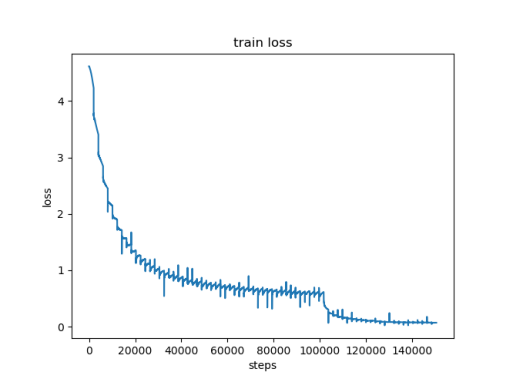

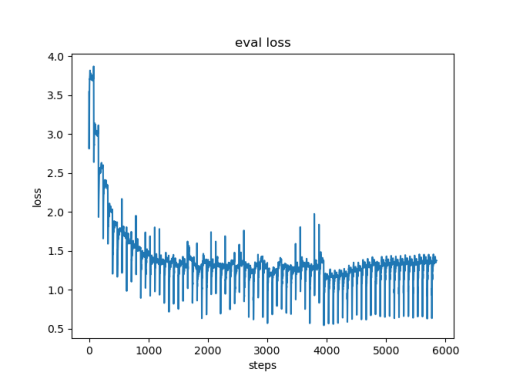

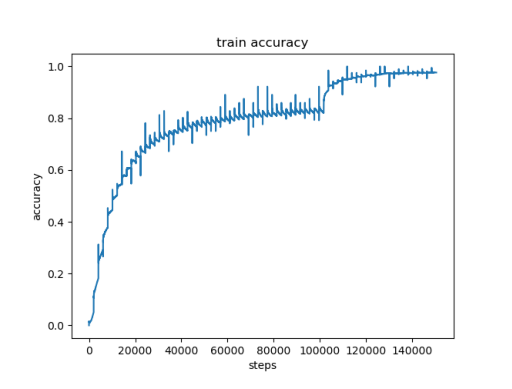

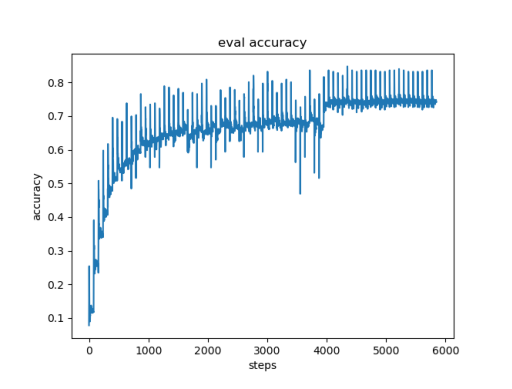

In [15]:
get_metrics("vgg11")

Model vgg13


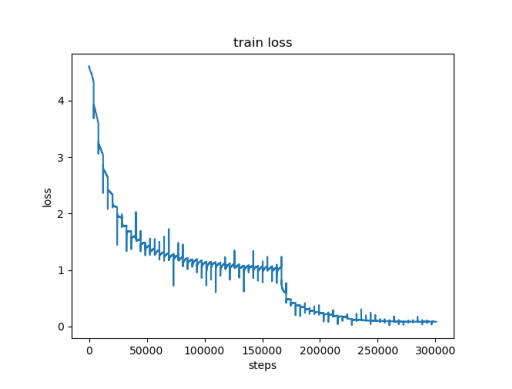

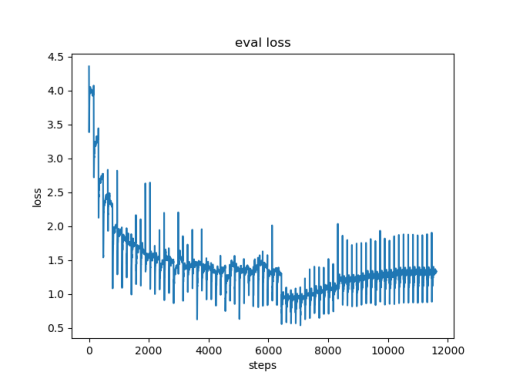

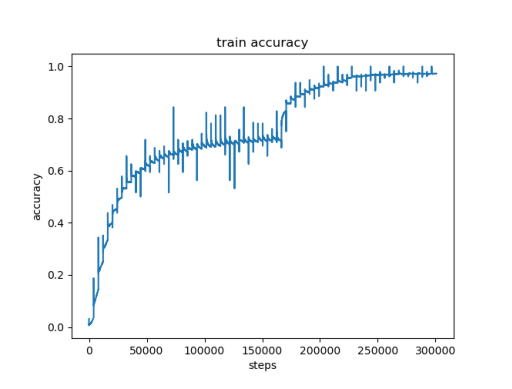

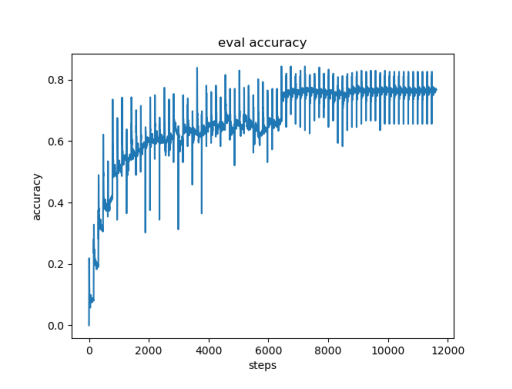

In [16]:
get_metrics("vgg13")

Model vgg16


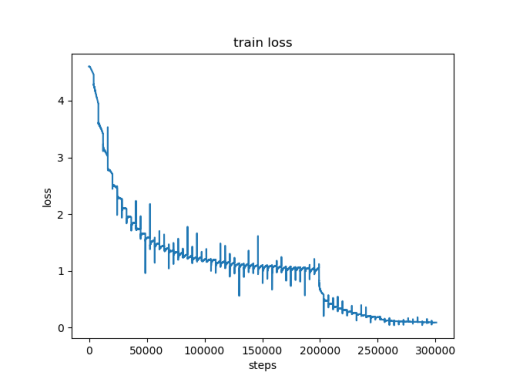

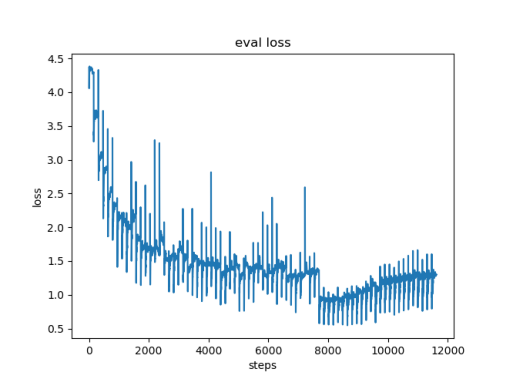

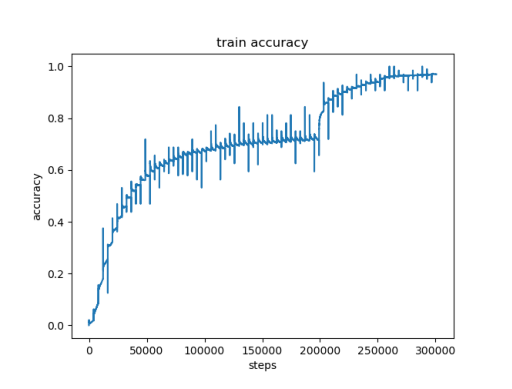

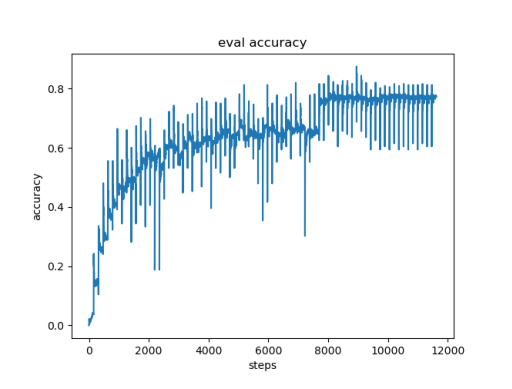

In [18]:
get_metrics("vgg16")

In [19]:
# get_metrics("vgg19")

In [20]:
!cat training-vgg11.log | tail

2025-06-04 13:55:56 [INFO] [Epoch 72/74] train_loss: 0.07720, train_acc: 0.97418, eval_loss: 1.37642, eval_acc: 0.74220
2025-06-04 13:55:57 [INFO] [Epoch 73/74] [Step 146304] train_loss: 0.17717, train_acc: 0.95312
2025-06-04 14:03:17 [INFO] [Epoch 73/74] [Step 147304] train_loss: 0.07389, train_acc: 0.97588
2025-06-04 14:10:37 [INFO] [Epoch 73/74] [Step 148304] train_loss: 0.07385, train_acc: 0.97561
2025-06-04 14:11:03 [INFO] [Epoch 73/74] train_loss: 0.07392, train_acc: 0.97558, eval_loss: 1.37304, eval_acc: 0.74180
2025-06-04 14:11:04 [INFO] [Epoch 74/74] [Step 148336] train_loss: 0.08110, train_acc: 0.98438
2025-06-04 14:18:24 [INFO] [Epoch 74/74] [Step 149336] train_loss: 0.07103, train_acc: 0.97679
2025-06-04 14:25:45 [INFO] [Epoch 74/74] [Step 150336] train_loss: 0.07159, train_acc: 0.97611
2025-06-04 14:26:10 [INFO] [Epoch 74/74] train_loss: 0.07160, train_acc: 0.97610, eval_loss: 1.38003, eval_acc: 0.74140
2025-06-04 14:26:11 [INFO] Model saved at vgg11.pth


In [21]:
!cat training-vgg13.log | tail

2025-06-07 14:02:29 [INFO] [Epoch 73/74] [Step 295536] train_loss: 0.08349, train_acc: 0.97141
2025-06-07 14:08:46 [INFO] [Epoch 73/74] [Step 296536] train_loss: 0.08268, train_acc: 0.97182
2025-06-07 14:09:27 [INFO] [Epoch 73/74] train_loss: 0.08256, train_acc: 0.97190, eval_loss: 1.33522, eval_acc: 0.76640
2025-06-07 14:09:28 [INFO] [Epoch 74/74] [Step 296599] train_loss: 0.04019, train_acc: 1.00000
2025-06-07 14:15:54 [INFO] [Epoch 74/74] [Step 297599] train_loss: 0.08383, train_acc: 0.97128
2025-06-07 14:22:13 [INFO] [Epoch 74/74] [Step 298599] train_loss: 0.08322, train_acc: 0.97200
2025-06-07 14:28:33 [INFO] [Epoch 74/74] [Step 299599] train_loss: 0.08331, train_acc: 0.97194
2025-06-07 14:34:56 [INFO] [Epoch 74/74] [Step 300599] train_loss: 0.08338, train_acc: 0.97207
2025-06-07 14:35:36 [INFO] [Epoch 74/74] train_loss: 0.08322, train_acc: 0.97209, eval_loss: 1.33808, eval_acc: 0.76640
2025-06-07 14:35:36 [INFO] Model saved at vgg13.pth


In [22]:
!cat training-vgg16.log | tail

2025-06-09 04:13:24 [INFO] [Epoch 73/74] [Step 295536] train_loss: 0.09319, train_acc: 0.96795
2025-06-09 04:20:32 [INFO] [Epoch 73/74] [Step 296536] train_loss: 0.09333, train_acc: 0.96790
2025-06-09 04:21:23 [INFO] [Epoch 73/74] train_loss: 0.09332, train_acc: 0.96785, eval_loss: 1.29060, eval_acc: 0.77120
2025-06-09 04:21:24 [INFO] [Epoch 74/74] [Step 296599] train_loss: 0.06961, train_acc: 0.93750
2025-06-09 04:28:31 [INFO] [Epoch 74/74] [Step 297599] train_loss: 0.08369, train_acc: 0.97150
2025-06-09 04:35:38 [INFO] [Epoch 74/74] [Step 298599] train_loss: 0.08642, train_acc: 0.97036
2025-06-09 04:42:45 [INFO] [Epoch 74/74] [Step 299599] train_loss: 0.08751, train_acc: 0.96953
2025-06-09 04:49:52 [INFO] [Epoch 74/74] [Step 300599] train_loss: 0.08754, train_acc: 0.96954
2025-06-09 04:50:42 [INFO] [Epoch 74/74] train_loss: 0.08737, train_acc: 0.96958, eval_loss: 1.30236, eval_acc: 0.77200
2025-06-09 04:50:43 [INFO] Model saved at vgg16.pth


In [ ]:
# !cat training-vgg19.log | tail

We used only accuracy as metrics because the dataset is balanced. We can see all the models overfitted on the training set. Here again second form of data augmentation which consists in altering the intensities of the RGB channels in training images may have helped to reduce generalization error.

The train-eval accuracy gap of VGG16 (~20%), VGG13's (~21%) and VGG11's (~23%) are very close. However, as we used deeper models, the generalization error is lower.

We did not train VGG19 (we will do it later) because of the amount of training time required.

To finish, the overfitting may be explained by the fact ImageNet-100 is too small (~130K for training size) and the models are too complex (+130M parameters) for the training set. So they memorize as the model capacity is higher than the data complexity. But we may consider improvement compared to our training with [Alexnet](../04-alex-net/main.ipynb)

In [23]:
import torch
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix

import dataset

We propose the confusion matrix on the validation dataset used during training.

In [24]:
batch_size = 32
data = dataset.ImageNet100(batch_size=batch_size)
num_classes = data.num_classes

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [25]:
def load_model(model, path):
    model.load_state_dict(torch.load(path))
    model.to(device)
    model.eval()

In [26]:
load_model(vgg11, "vgg11.pth")
load_model(vgg13, "vgg13.pth")
load_model(vgg16, "vgg16.pth")
# load_model(vgg19, "vgg19.pth")

/tmp/ipykernel_1287073/1247942088.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


In [27]:
def get_eval_confusion_matrix(model, eval_dataloader):
    all_preds = []
    all_true = []
    for batch in eval_dataloader:
        batch = [a.to(device) for a in batch]
        with torch.no_grad():
            output = model(*batch[:-1])
            pred = output.argmax(dim=-1).detach().cpu().numpy()
            all_preds.append(pred)
            all_true.append(batch[-1].detach().cpu().numpy())

    return confusion_matrix(y_true=np.concatenate(all_true), y_pred=np.concatenate(all_preds))

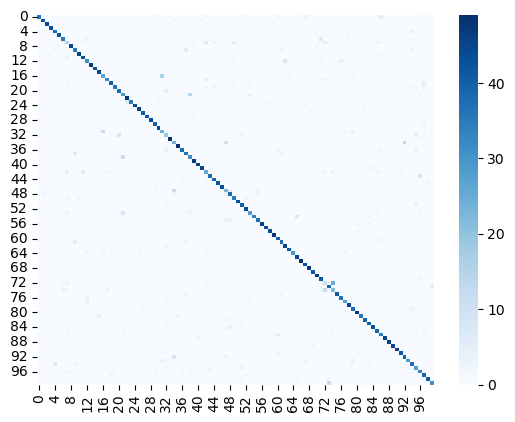

In [29]:
vgg16_eval_cm = get_eval_confusion_matrix(vgg16, data.eval_dataloader)
sns.heatmap(vgg16_eval_cm, cmap="Blues"); plt.show()

In [31]:
# vgg19_eval_cm = get_eval_confusion_matrix(vgg19, data.eval_dataloader)
# sns.heatmap(vgg19_eval_cm, cmap="Blues"); plt.show()

In [32]:
import os

In [33]:
test_set = [np.array(Image.open(path).convert("RGB")) for path in os.scandir("/home/malick/datasets/imagenet-100/test-set")]

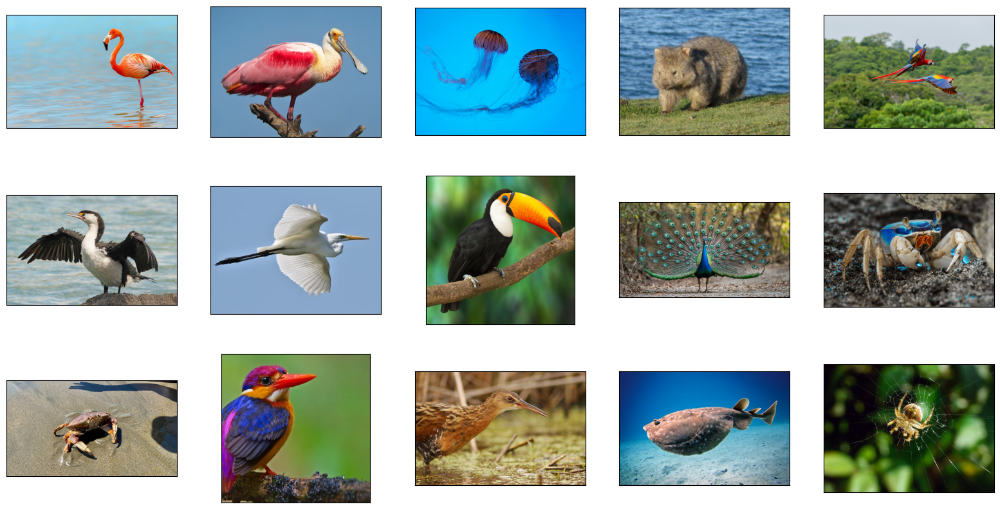

In [34]:
fig, axes = plt.subplots(3, 5, figsize=(19.8,10.2))
axes = axes.ravel()
for i in range(len(axes)):
    axes[i].imshow(test_set[i], cmap="gray")
    axes[i].set_xticks([])
    axes[i].set_yticks([])
plt.show()

In [35]:
import inference

In [36]:
def get_preds(model):
    preds = []
    for im in test_set:
        pred = inference.predict(model, torch.tensor(im, dtype=torch.float32).permute(2,0,1) / 255., device=device)
        preds.append(pred)
    return preds

In [37]:
vgg11_preds = get_preds(vgg11)
vgg13_preds = get_preds(vgg13)
vgg16_preds = get_preds(vgg16)
# vgg19_preds = get_preds(vgg19)

In [38]:
def visualize_preds(preds):
    labels = [data.labels_idx2str[p[0]] for p in preds]
    probs = [max(p[1]) for p in preds]

    fig, axes = plt.subplots(3, 5, figsize=(19.8,10.2))
    axes = axes.ravel()
    for i in range(len(axes)):
        axes[i].imshow(test_set[i], cmap="gray")
        axes[i].set_xticks([])
        axes[i].set_yticks([])
        axes[i].set_title(labels[i] + ", p=" + str(probs[i])[:5], fontsize=10)
    plt.show()

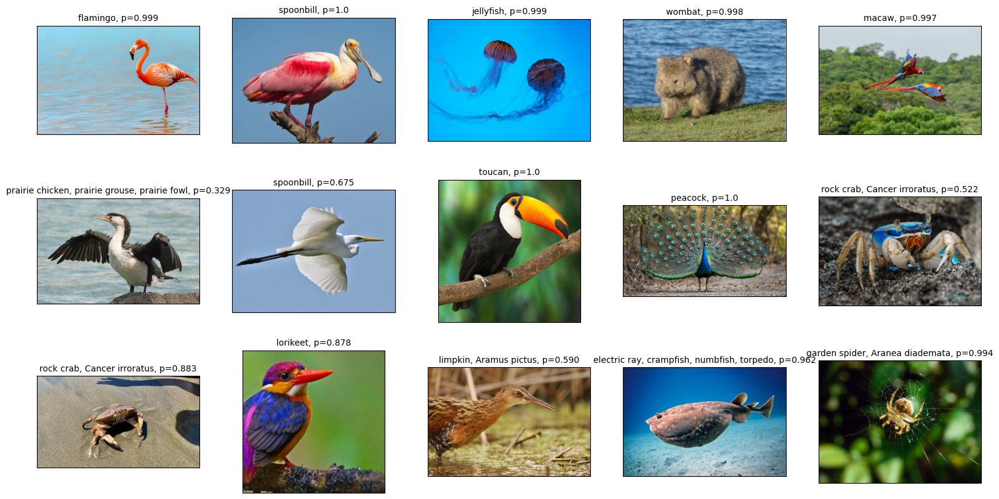

In [39]:
visualize_preds(vgg11_preds)

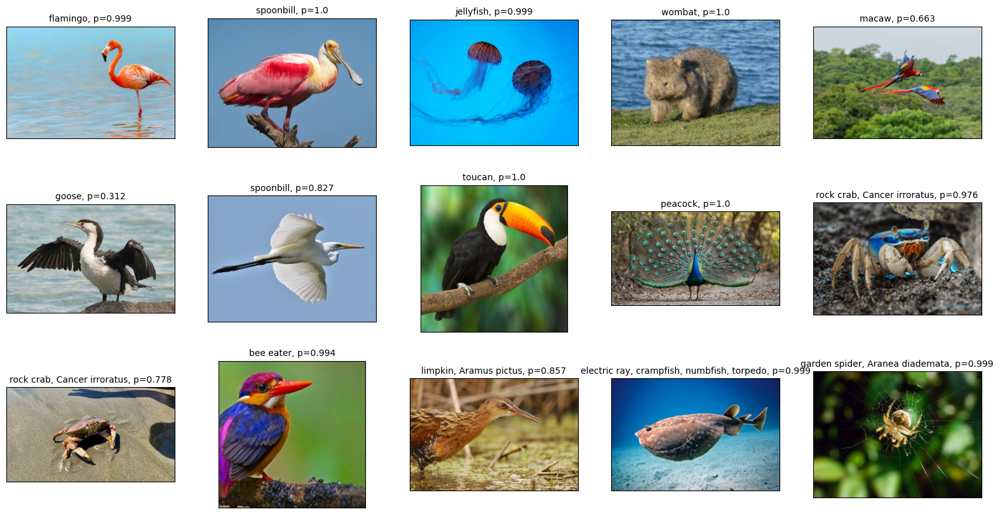

In [40]:
visualize_preds(vgg13_preds)

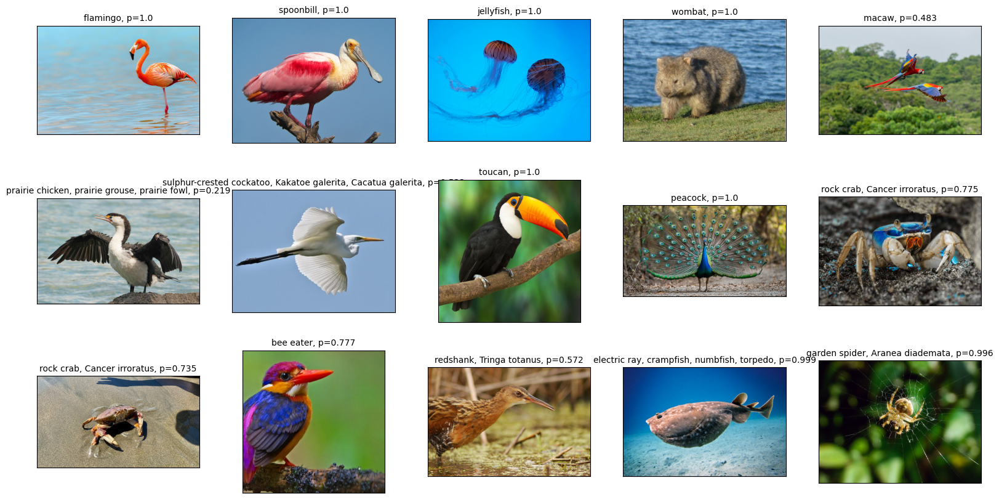

In [41]:
visualize_preds(vgg16_preds)

In [42]:
# visualize_preds(vgg19_preds)

The two models differ in prediction for 13th image.

In [43]:
def visualize_other_labels_predicted(preds):
    other_plosible_preds = [4, 5, 6, 9, 10, 11, 12, 13] # choosed in purpose of having other possible labels

    fig, axes = plt.subplots(4, 4, figsize=(19.8,10.2))
    for idx, i in enumerate(other_plosible_preds):
        pred = preds[i]
        axes[idx//4*2, idx%4].imshow(test_set[i], cmap="gray")

        top3 = np.argsort(pred[1])[-3:]
        top3 = [(data.labels_idx2str[i], pred[1][i]) for i in top3]
        labels = [x[0] for x in top3]
        values = [x[1] for x in top3]
        axes[idx//4*2+1, idx%4].barh(labels, values, height=0.15, color='steelblue')
        for i, (value, label) in enumerate(zip(values, labels)):
            axes[idx//4*2+1, idx%4].text(0, i, label.split(",")[0] + ": " + str(value)[:5], 
                    color='red', va='center', ha="left", fontsize=10, weight='bold')
        axes[idx//4*2+1, idx%4].set_xticks([])
        axes[idx//4*2+1, idx%4].set_yticks([])
        axes[idx//4*2, idx%4].set_xticks([])
        axes[idx//4*2, idx%4].set_yticks([])
    plt.show()

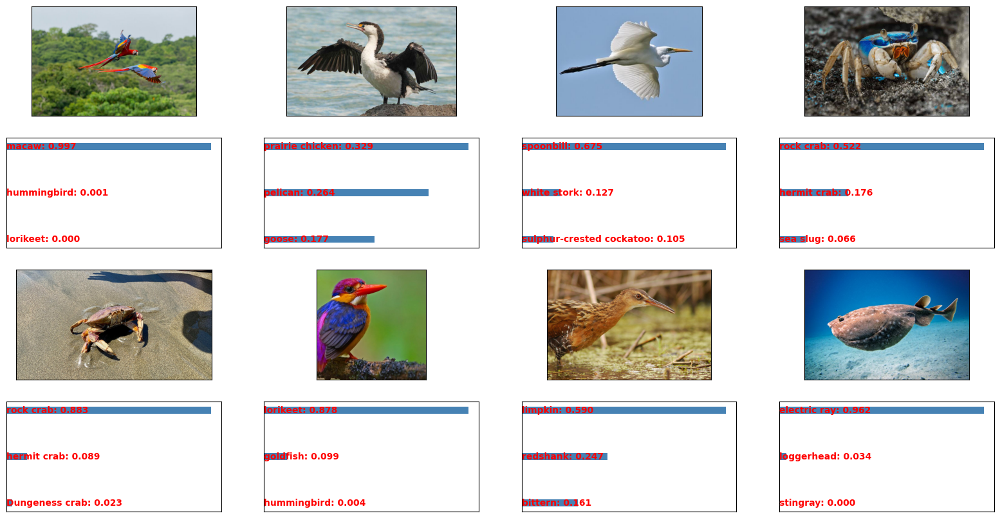

In [44]:
visualize_other_labels_predicted(vgg11_preds)

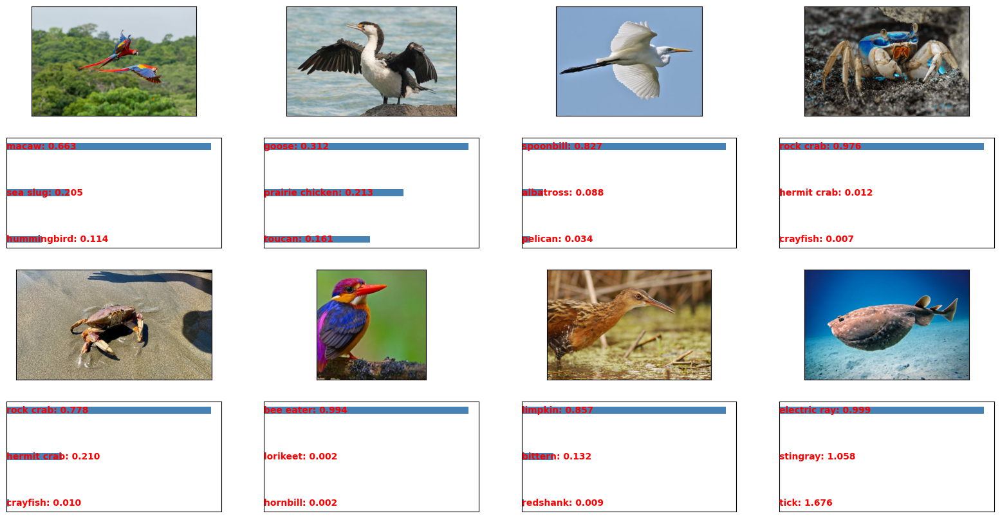

In [45]:
visualize_other_labels_predicted(vgg13_preds)

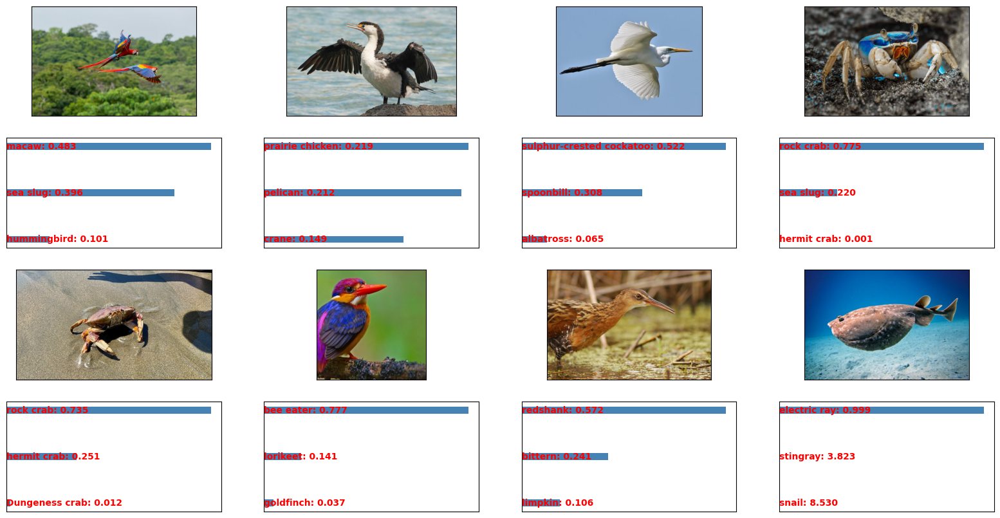

In [46]:
visualize_other_labels_predicted(vgg16_preds)

We remark very different probabilities in this difficult cases. First VGG11, VGG13 and VGG16 all seems to have less confident in the classification of the second image above (black and white bird) as probabilities does not even exceed 40%. We can make the same analysis for the 7th image between labels: "redshank", "bittern" and "limpkin". On the 1st image, VGG11 had a hight probabilities than others. To finish, on the 6th image above, VGG11 made a different prediction compared to the predictions made by VGG13 and VGG16 (lorikeet is their second most probable label but with lower confidence).

This is a very low test set and our goal was to see what are the prediction probabilities of each model in some ambiguous cases. Topk-accuracy and error are more suitable to make analysis.

In [47]:
# visualize_other_labels_predicted(vgg19_preds)

### Topk error

In [53]:
def compute_top_k_error(model, eval_dataloader, k: int=5):
    topk_acc = 0
    num_instances = 0
    for batch in eval_dataloader:
        batch = [a.to(device) for a in batch]
        with torch.no_grad():
            output = model(*batch[:-1])
            _, pred = output.topk(k, dim=1)
            topk_acc += (pred==batch[-1].view(-1, 1).expand_as(pred)).any(dim=-1).float().sum().item()
            num_instances += batch[-1].size(0)
    topk_acc /= num_instances
    return topk_acc, 1-topk_acc

In [57]:
for k in range(1, 6, 2):
    topk_acc, topk_error = compute_top_k_error(model=vgg11, eval_dataloader=data.eval_dataloader, k=k)
    print(f"VGG11: top{k}_accuracy: {topk_acc:.5f}, top{k}_error: {topk_error:.5f}")

VGG11: top1_accuracy: 0.74140, top1_error: 0.25860
VGG11: top3_accuracy: 0.88100, top3_error: 0.11900
VGG11: top5_accuracy: 0.92360, top5_error: 0.07640


In [55]:
for k in range(1, 6, 2):
    topk_acc, topk_error = compute_top_k_error(model=vgg13, eval_dataloader=data.eval_dataloader, k=k)
    print(f"VGG13: top{k}_accuracy: {topk_acc:.5f}, top{k}_error: {topk_error:.5f}")

VGG13: top1_accuracy: 0.76640, top1_error: 0.23360
VGG13: top3_accuracy: 0.89820, top3_error: 0.10180
VGG13: top5_accuracy: 0.93240, top5_error: 0.06760


In [56]:
for k in range(1, 6, 2):
    topk_acc, topk_error = compute_top_k_error(model=vgg16, eval_dataloader=data.eval_dataloader, k=k)
    print(f"VGG16: top{k}_accuracy: {topk_acc:.5f}, top{k}_error: {topk_error:.5f}")

VGG16: top1_accuracy: 0.77200, top1_error: 0.22800
VGG16: top3_accuracy: 0.90620, top3_error: 0.09380
VGG16: top5_accuracy: 0.93620, top5_error: 0.06380


In [52]:
# for k in range(1, 6, 2):
#     topk_acc, topk_error = compute_top_k_error(model=vgg19, eval_dataloader=data.eval_dataloader, k=k)
#     print(f"VGG19: top{k}_accuracy: {topk_acc:.5f}, top{k}_error: {topk_error:.5f}")

To finish VGG models highly outperformed Alexnet on Imagenet-100 dataset. Here is a table of comparison with +16% of topk-accuracy on evaluation set, with a doubled number of trainable parameters and more convolutionnal layers used. 

|                                    | Alexnet           | VGG11            | VGG13                  | VGG16                   | VGG19                     |
|:-----------------------------------|:------------------|:-----------------|:-----------------------|:------------------------|:--------------------------|
| Number of layers                   | 8                 | 11               | 13                     | 16                      | 19                        |
| Number of conv layers              | 5                 | 8                | 10                     | 13                      | 16                        |
| Number of dense layers             | 3                 | 3                | 3                      | 3                       | 3                         |
| Local repose normalization         | yes               | no               | no                     | no                      | no                        |
| Number of parameters (M)           | ~58.7             | ~129.1           | ~129.3                 | ~134.6                  | ~139.9                    |
| Train max epochs                   | 90                | 74               | 74                     | 74                      | 74                        |
| Training duration                  | 12 hours 34 mins  | 18 hours 44 mins | 1 day 7 hours 27 mins  | 1 day 12 hours 29 mins  |                           |
| Top1_acc (%)                       | 68.38             | 74.14            | 76.64                  | **77.20**               |                           |
| Top3_acc (%)                       | 84.24             | 88.10            | 89.82                  | **90.62**               |                           |
| Top5_acc (%)                       | 88.72             | 92.36            | 93.24                  | **93.62**               |                           |